# Master Fig 2

In [1]:
library(ggplot2)
library(patchwork)

In [2]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

## Load Subfigs

In [41]:
# OSKM Expression
OCT4_expr = readRDS("./subfigs/20201031_POU5F1_expr_sc.rds")
SOX2_expr = readRDS("./subfigs/20201031_SOX2_expr_sc.rds")
KLF4_expr = readRDS("./subfigs/20201031_KLF4_expr_sc.rds")
MYC_expr = readRDS("./subfigs/20201031_MYC_expr_sc.rds")

In [25]:
# OSKM ChromVAR
OCT4_cv = readRDS("./subfigs/20201031_POU5F1_chromvar.rds")
SOX2_cv = readRDS("./subfigs/20201031_SOX2_chromvar.rds")
KLF4_cv = readRDS("./subfigs/20201031_KLF4_chromvar.rds")
MYC_cv = readRDS("./subfigs/20201031_MYC_chromvar.rds")

In [61]:
# OSKM states
OSKM_states = readRDS("./subfigs/20201101_OSKM_states.rds")

In [4]:
# broser shots
# MAP2 = readRDS("./subfigs/20200712_MAP2.rds")
# JAKMIP2 = readRDS("./subfigs/20200712_JAKMIP2.rds")
# KRT16 = readRDS("./subfigs/20200712_KRT16.rds")
# KLK11 = readRDS("./subfigs/20200712_KLK11.rds")
# browser_labels = readRDS("./subfigs/20200623_browser_labels.rds")

In [5]:
# gene score plots
# MAP2_gs = readRDS("./subfigs/20200630_MAP2_gs.rds")
# JAKMIP2_gs = readRDS("./subfigs/20200630_JAKMIP2_gs.rds")
# KRT16_gs = readRDS("./subfigs/20200630_KRT16_gs.rds")
# KLK11_gs = readRDS("./subfigs/20200630_KLK11_gs.rds")

In [77]:
ATAC_PAGA = readRDS("./subfigs/20201101_ATAC_PAGA_connectivities.rds")

In [78]:
traj_arrows = readRDS("./subfigs/20201101_traj_arrows.rds")

In [79]:
terminal_expression = readRDS("./subfigs/20201031_terminal_expression_matrix.rds")

### Configs

In [6]:
cluster_config = read.table("../configs/cluster.tsv", comment.char = '', header=T, sep='\t')
cluster_config$colour = as.character(cluster_config$colour)
cluster_config$description = as.character(cluster_config$description)

rownames(cluster_config) = cluster_config$cluster
cluster_config

,cluster,colour,description,new_cluster
,<int>,<chr>,<chr>,<int>
1,1,#F4D5CD,Intermediate,12
2,2,#78A824,Pre-iPSC,15
3,3,#F01D35,Fibroblast-like,5
4,4,#E85F6D,Fibroblast-like,3
5,5,#B03743,Fibroblast,1
6,6,#7C2730,Fibroblast,2
7,7,#CF175A,Fibroblast-like,4
8,8,#CCCCCC,Doublets,17
9,9,#F7A6C2,Keratinocyte-like,6


In [7]:
# slight tweak for long name
cluster_config[11, "description"] = "Partially\nreprogrammed"

## Assemble Components

In [8]:
horizontal_spacers <- function(plot, widths=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), widths=widths)
}

vertical_spacers <- function(plot, heights=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), ncol=1, heights=heights)
}

placeholder_plot <- function(text, size=1) {
    df = data.frame(x=c(0), y=c(0), t=c(text))
    ggplot(df)+
    geom_text(aes(x=x,y=y,label=t), size=size)+
    theme_void()+
    theme(panel.border = element_rect(colour = "black", fill=NA, size=0.5),
                                                       plot.margin = unit(c(0,0,0,0), "pt"))
}

### OSKM Expr + ChromVAR + OSKM states

In [69]:
expr_to_cv_ratio = c(5,6)

In [70]:
O_plots = wrap_plots(OCT4_expr, 
                     OCT4_cv,
                     heights=expr_to_cv_ratio)

S_plots = wrap_plots(SOX2_expr,
                     SOX2_cv,
                     heights=expr_to_cv_ratio)

K_plots = wrap_plots(KLF4_expr,
                    KLF4_cv,
                    heights=expr_to_cv_ratio)

M_plots = wrap_plots(MYC_expr,
                    MYC_cv,
                    heights=expr_to_cv_ratio)

# y padding
expr_cv = wrap_plots(O_plots,
                     S_plots,
                     K_plots,
                     M_plots,
                     nrow=1)

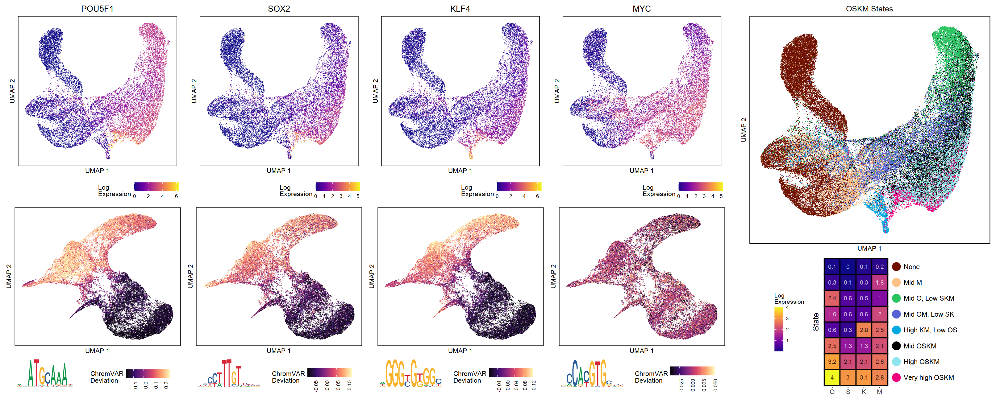

In [71]:
options(repr.plot.width = 27, repr.plot.height = 11)

row1_plot = wrap_plots(expr_cv, 
           plot_spacer(),
           OSKM_states, 
           widths=c(20,0,7))

row1_plot

### Trajectories + Terminal RNA Expression

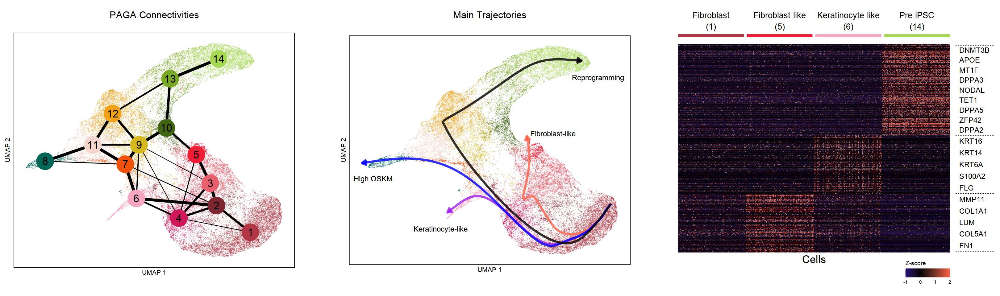

In [80]:
options(repr.plot.width = 27, repr.plot.height = 8)

row2_plot = wrap_plots(vertical_spacers(ATAC_PAGA),
           plot_spacer(),
           vertical_spacers(traj_arrows),
           plot_spacer(),
           vertical_spacers(terminal_expression),
          widths=c(8,1,8,1,9))

row2_plot

## Assemble Master

In [81]:
main_fig = wrap_plots(row1_plot, 
                      row2_plot, 
                      ncol=1, heights=c(11,8))

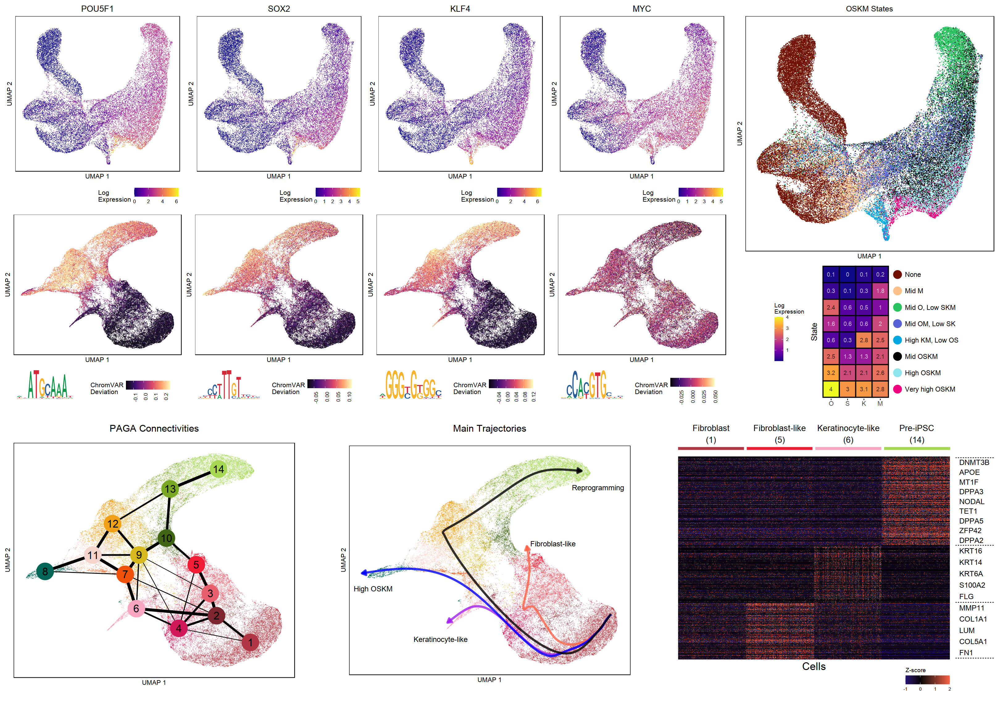

In [83]:
options(repr.plot.width = 27, repr.plot.height = 19)
main_fig

In [ ]:
ggsave(main_fig, "tmp.pdf", height = 27, width=11)